# Geometrical Methods in Machine Learning
## Homework 1

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

import pandas as pd
import numpy as np
from sklearn.datasets import fetch_openml

from sklearn.decomposition import PCA, FastICA

### Task 1: PCA, interpretation (2 points)

Consider Ozone Level dataset, https://archive.ics.uci.edu/ml/datasets/Ozone+Level+Detection.

Apply PCA analysis to data to find PCA estimate of data dimensionality given by the number of variables explaining 80% and 95% of the variance.

Draw and interpret biplots of the first two principal components and top 5 features with the highest influence (largest absolute eigenvalue coefficient) to each first two principal components. Can you interpret the each of first two principal components in terms of original variables? Are there any meaningful groupings in the original variables?

Comment whether PCA is applicable to categorical variables, as well as your preprocessing strategy for them.

In [ ]:
X, y = fetch_openml("ozone_level", return_X_y=True)
X

/usr/local/lib/python3.10/dist-packages/sklearn/datasets/_openml.py:968: FutureWarning: The default value of `parser` will change from `'liac-arff'` to `'auto'` in 1.4. You can set `parser='auto'` to silence this warning. Therefore, an `ImportError` will be raised from 1.4 if the dataset is dense and pandas is not installed. Note that the pandas parser may return different data types. See the Notes Section in fetch_openml's API doc for details.
  warn(


,WSR0,WSR1,WSR2,WSR3,WSR4,WSR5,WSR6,WSR7,WSR8,WSR9,...,T50,RH50,U50,V50,HT50,KI,TT,SLP,SLP_,Precp
0,0.8,1.8,2.4,2.1,2,2.1,1.5,1.7,1.9,2.3,...,-15.5,0.15,10.67,-1.56,5795,-12.1,17.9,10330,-55,0
1,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,3.4,...,-14.5,0.48,8.39,3.84,5805,14.05,29,10275,-55,0
2,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,2.5,...,-15.9,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0
3,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,3.1,...,-16.8,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08
4,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,1.4,...,?,?,?,?,?,?,?,?,?,0.58
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2531,0.3,0.4,0.5,0.5,0.2,0.3,0.4,0.4,1.3,2.2,...,-12.4,0.07,7.93,-4.41,5800,-25.6,21.8,10295,65,0
2532,1,1.4,1.1,1.7,1.5,1.7,1.8,1.5,2.1,2.4,...,-12,0.04,5.95,-1.14,5845,-19.4,19.1,10310,15,0
2533,0.8,0.8,1.2,0.9,0.4,0.6,0.8,1.1,1.5,1.5,...,-11.8,0.06,7.8,-0.64,5845,-9.6,35.2,10275,-35,0
2534,1.3,0.9,1.5,1.2,1.6,1.8,1.1,1,1.9,2,...,-10.8,0.25,7.72,-0.89,5845,-19.6,34.2,10245,-30,0.05


---
Remove rows with unfilled values



In [ ]:
X = X.apply(pd.to_numeric, errors='coerce').dropna()

In [ ]:
y = y.loc[X.index]

In [ ]:
X.shape

(1848, 72)

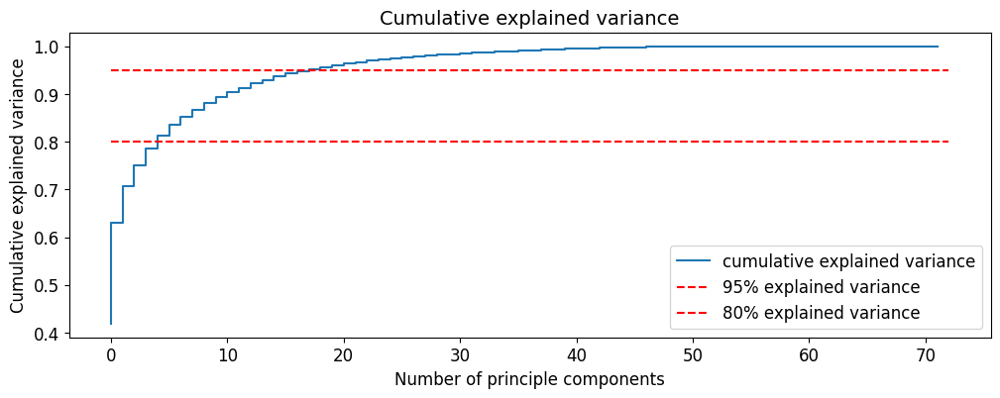

In [ ]:
from sklearn.preprocessing import StandardScaler

# Standardize the features
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)

pca = PCA()
X_pca = pca.fit_transform(X_standardized)

plt.figure(figsize=(12, 4))
plt.step(
    range(len(pca.components_)), np.cumsum(pca.explained_variance_ratio_), label='cumulative explained variance'
)
plt.hlines(
    y=0.95, xmin=0, xmax=len(pca.components_), colors='r', linestyles='dashed', label='95% explained variance'
)
plt.hlines(
    y=0.8, xmin=0, xmax=len(pca.components_), colors='r', linestyles='dashed', label='80% explained variance'
)
plt.title('Cumulative explained variance', fontsize=14)
plt.xlabel('Number of principle components', fontsize=12)
plt.ylabel('Cumulative explained variance', fontsize=12)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.legend(fontsize=12)
plt.show()

Now a bit closer look using code from Seminar 1:

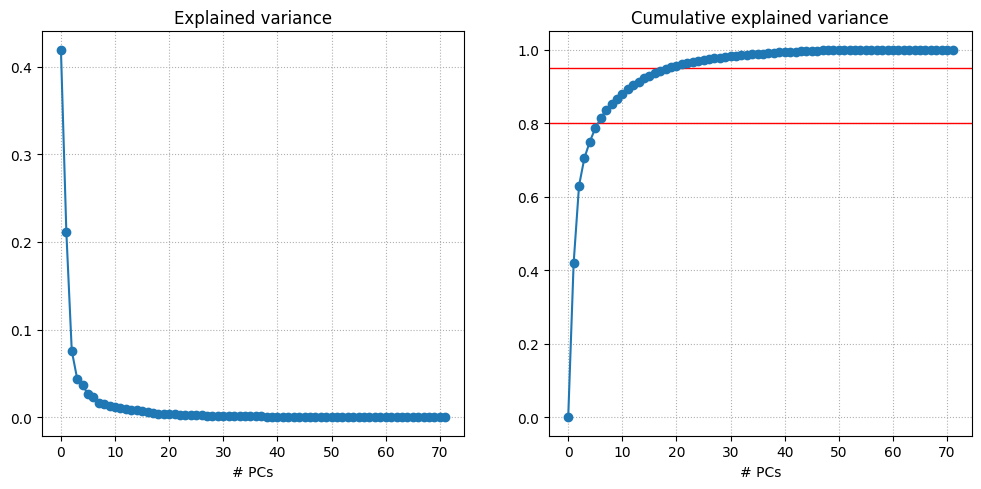

In [ ]:
components = pca.components_

def EV_i(i, eigenvalues):
    return eigenvalues[i] / np.sum(eigenvalues)

def CEV_d(d, eigenvalues):
    eigenvalues_d_sum = 0
    for i in range(d):
        eigenvalues_d_sum += eigenvalues[i]
    return eigenvalues_d_sum / np.sum(eigenvalues)

EV = []
CEV = []

for i in range(X.shape[1]):
    EV.append(EV_i(i, pca.explained_variance_))
    CEV.append(CEV_d(i, pca.explained_variance_))

# plot EV/CEVs
fig = plt.figure(figsize=(12,5.25))

plt.subplot(121)
plt.title("Explained variance")
plt.xlabel("# PCs")
plt.grid(linestyle="dotted")
plt.plot(EV, "o-")

plt.subplot(122)
plt.title("Cumulative explained variance")
plt.axhline(linewidth=1, y=0.95, color='r')
plt.axhline(linewidth=1, y=0.8, color='r')
plt.xlabel("# PCs")
plt.grid(linestyle="dotted")
plt.plot(CEV, "o-")

In [ ]:
for index, element in enumerate(CEV):
    print(f"({index + 1}, {element})")
    if element > 0.95:
        break

(1, 0.0)
(2, 0.4191995380877463)
(3, 0.630379664773983)
(4, 0.7063741319605156)
(5, 0.750382849341601)
(6, 0.7867561882684729)
(7, 0.813501178876004)
(8, 0.8365063790697559)
(9, 0.8528260031736002)
(10, 0.8674952041586524)
(11, 0.8806657894253888)
(12, 0.8926634862017887)
(13, 0.9036181535999308)
(14, 0.9132540652069456)
(15, 0.9220901232104418)
(16, 0.9299270426472375)
(17, 0.9372232359342015)
(18, 0.9431335845659768)
(19, 0.9481881191811409)
(20, 0.9525651414304857)


For explaining 80% and 95% of the variance we need only **7** and **20** components respectively

---

In [ ]:
# Get the top 5 features for each of the first two principal components
top_features_pc1 = np.argsort(np.abs(components[0]))[-5:]
top_features_pc2 = np.argsort(np.abs(components[1]))[-5:]

# Combine the indices
top_features_indices = np.unique(np.concatenate((top_features_pc1, top_features_pc2)))


feature_names = X.columns[top_features_indices]
print("Top features influencing the first two principal components:")
print([index for index in feature_names])

Top features influencing the first two principal components:
['WSR2', 'WSR3', 'WSR11', 'WSR_PK', 'WSR_AV', 'T9', 'T10', 'T19', 'T20', 'T_AV']


Seems like first component explain wind speed features only and the second explain temperature features. Very nice, **PCA** really divided the components into semantic groups.

Top features influencing the first two principal components:
Index(['WSR2', 'WSR3', 'WSR11', 'WSR_PK', 'WSR_AV', 'T9', 'T10', 'T19', 'T20',
       'T_AV'],
      dtype='object')


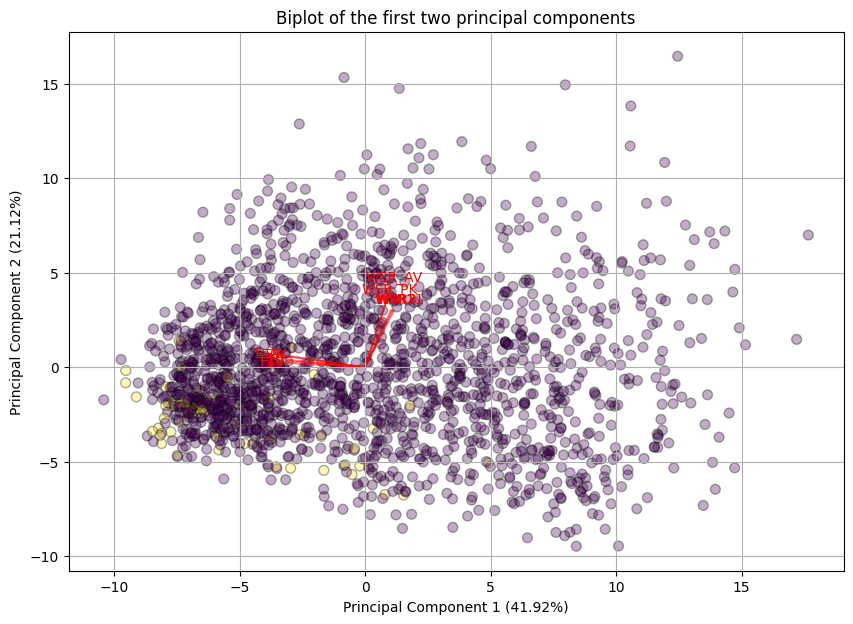

In [ ]:
scaler = StandardScaler()
X_standardized = scaler.fit_transform(X)
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_standardized)
components = pca.components_
explained_variance = pca.explained_variance_ratio_
top_features_pc1 = np.argsort(np.abs(components[0]))[-5:]
top_features_pc2 = np.argsort(np.abs(components[1]))[-5:]
top_features_indices = np.unique(np.concatenate((top_features_pc1, top_features_pc2)))
feature_names = X.columns[top_features_indices]

def biplot(X_pca, components, feature_names, explained_variance, top_features_indices):
    plt.figure(figsize=(10, 7))
    plt.scatter(X_pca[:, 0], X_pca[:, 1], c=y, edgecolor='k', s=50, alpha=0.33)

    for i in top_features_indices:
        plt.arrow(0, 0, components[0, i]*max(X_pca[:,0]), components[1, i]*max(X_pca[:,1]),
                  color='r', alpha=0.5, head_width=0.05)
        plt.text(components[0, i]*max(X_pca[:,0])*1.2, components[1, i]*max(X_pca[:,1])*1.2,
                 feature_names[i], color='red', ha='center', va='center')

    plt.xlabel(f'Principal Component 1 ({explained_variance[0]*100:.2f}%)')
    plt.ylabel(f'Principal Component 2 ({explained_variance[1]*100:.2f}%)')
    plt.title('Biplot of the first two principal components')
    plt.grid()
    plt.show()

# Draw the biplot
biplot(X_pca, components, X.columns, pca.explained_variance_ratio_, top_features_indices)

**PCA** is not directly applicable to categorical variables due to its reliance on covariance and Euclidean distances.
Preprocessing strategies like **One-Hot Encoding, Ordinal Encoding, Binary Encoding, or Frequency Encoding** can be applied depending on the features; for example in [another project](https://github.com/WastingT-me/Intro-To-DS-Skoltech-2022/blob/main/Final_Project.ipynb) I research water's qality and there are many categorical features of diffrent meanings.

### Task 2: PCA, classification (2 points)

Consider the classification problem of predicting the target variable `y` of eight vs one hour peak data subset. Apply a classifier of your choice on raw data and PCA-reduced data for specified explained variance level. Conclude whether applying PCA was able to improve the classification results.

Perform a feature selection, selecting top 5 performing features, with any technique you know, compare them with top 5 features influencing the first two principal components.

In [ ]:
import warnings
warnings.filterwarnings("ignore")

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score, accuracy_score
from sklearn.feature_selection import SelectKBest, f_classif

url = "https://archive.ics.uci.edu/ml/machine-learning-databases/ozone/eighthr.data"
columns = ["V" + str(i) for i in range(1, 73)] + ["target"]
data = pd.read_csv(url, names=columns)

data.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V64,V65,V66,V67,V68,V69,V70,V71,V72,target
1/1/1998,0.8,1.8,2.4,2.1,2,2.1,1.5,1.7,1.9,2.3,...,0.15,10.67,-1.56,5795,-12.1,17.9,10330,-55,0,0.0
1/2/1998,2.8,3.2,3.3,2.7,3.3,3.2,2.9,2.8,3.1,3.4,...,0.48,8.39,3.84,5805,14.05,29,10275,-55,0,0.0
1/3/1998,2.9,2.8,2.6,2.1,2.2,2.5,2.5,2.7,2.2,2.5,...,0.6,6.94,9.8,5790,17.9,41.3,10235,-40,0,0.0
1/4/1998,4.7,3.8,3.7,3.8,2.9,3.1,2.8,2.5,2.4,3.1,...,0.49,8.73,10.54,5775,31.15,51.7,10195,-40,2.08,0.0
1/5/1998,2.6,2.1,1.6,1.4,0.9,1.5,1.2,1.4,1.3,1.4,...,?,?,?,?,?,?,?,?,0.58,0.0


In [ ]:
# remove missing values
data = data.apply(pd.to_numeric, errors='coerce').dropna()

X = data.drop("target", axis=1)
y = data["target"]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [ ]:
# Apply PCA for specified explained variance in interval (0.5, 0.95)
X_train_pca = []
X_test_pca = []

print(f"Original number of features: {X_train_scaled.shape[1]}")
for var in range(95, 45, -5):
    pca = PCA(n_components=var/100, random_state=42)
    X_train_pca.append(pca.fit_transform(X_train_scaled))
    X_test_pca.append(pca.transform(X_test_scaled))

    print(f"Reduced number of features after PCA with {var/100} explained variance: {X_train_pca[-1].shape[1]}")

Original number of features: 72
Reduced number of features after PCA with 0.95 explained variance: 19
Reduced number of features after PCA with 0.9 explained variance: 12
Reduced number of features after PCA with 0.85 explained variance: 8
Reduced number of features after PCA with 0.8 explained variance: 6
Reduced number of features after PCA with 0.75 explained variance: 4
Reduced number of features after PCA with 0.7 explained variance: 3
Reduced number of features after PCA with 0.65 explained variance: 3
Reduced number of features after PCA with 0.6 explained variance: 2
Reduced number of features after PCA with 0.55 explained variance: 2
Reduced number of features after PCA with 0.5 explained variance: 2


F1 score on raw data: 0.27999999999999997
Accuracy on raw data: 0.9351351351351351


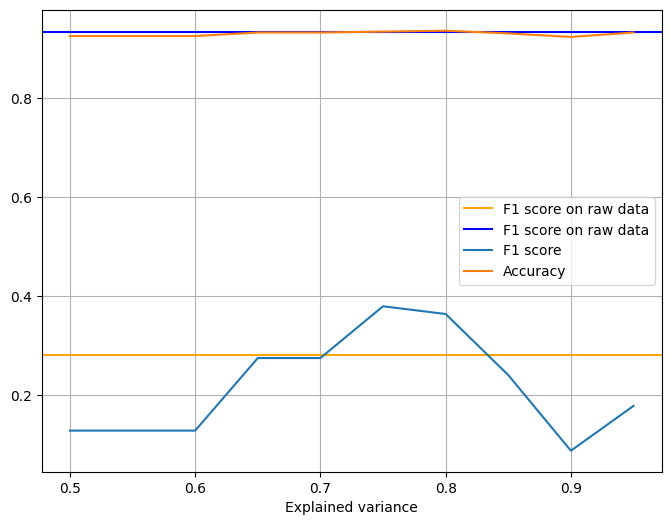

In [ ]:
# Applying classifier
clf_raw = RandomForestClassifier(random_state=42)
clf_raw.fit(X_train_scaled, y_train)
y_pred_raw = clf_raw.predict(X_test_scaled)
f1_raw = f1_score(y_test, y_pred_raw)
accuracy_raw = accuracy_score(y_test, y_pred_raw)

# With PCA
f1_pca = []
accuracy_pca = []
print(f"F1 score on raw data: {f1_raw}")
print(f"Accuracy on raw data: {accuracy_raw}")
var = 100
for j in range(len(X_train_pca)):
    var = var - 5
    clf_pca = RandomForestClassifier(random_state=42)
    clf_pca.fit(X_train_pca[j], y_train)
    y_pred_pca = clf_pca.predict(X_test_pca[j])
    f1_pca.append(f1_score(y_test, y_pred_pca))
    accuracy_pca.append(accuracy_score(y_test, y_pred_pca))

var = [i/100 for i in range(50, 100, 5)]

plt.figure(figsize=(8, 6))
plt.axhline(y=f1_raw, color='orange', linestyle='-', label="F1 score on raw data")
plt.axhline(y=accuracy_raw, color='blue', linestyle='-', label="F1 score on raw data")
plt.plot(var, f1_pca[::-1], label="F1 score")
plt.plot(var, accuracy_pca[::-1], label="Accuracy")
plt.xlabel('Explained variance')
plt.legend()
plt.grid()
plt.show()

It seems that the data is quite noisy, and the classifier works better after PCA with a low explained variance (0.75 or 0.8)

In [ ]:
# Feature selection using SelectKBest
selector = SelectKBest(f_classif, k=5)
selector.fit(X_train_scaled, y_train)
X_train_selected = selector.transform(X_train_scaled)
X_test_selected = selector.transform(X_test_scaled)
top_5_features = selector.get_support(indices=True)
print(f"Top 5 features selected by SelectKBest: {top_5_features}")

# Feature importance from RandomForest
importances = clf_raw.feature_importances_
indices = np.argsort(importances)[::-1]
top_5_importances = indices[:5]
print(f"Top 5 important features from RandomForest: {top_5_importances}")

# Top features influencing the first two principal components
pca_components = pca.components_[:2]
top_pca_features = np.argsort(np.abs(pca_components).sum(axis=0))[::-1][:5]
print(f"Top 5 features influencing the first two principal components: {top_pca_features}")

Top 5 features selected by SelectKBest: [39 40 41 42 43]
Top 5 important features from RandomForest: [67 12 40 41 58]
Top 5 features influencing the first two principal components: [25 24 30 29 31]


### Task 3: ICA, optimization (2 points)

Implement ICA solution with the (projected) gradient descent optimization scheme, using one of the following loss functions (see Lecture 3 slides):

- kurtosis, or
- negative entropy, or
- mutual information.

To which classes of the approaches to the solution of ICA problem those loss functions belong to?

Apply ICA using obtained optimization procedure to the mixture of $X_1 \sim Laplace(0,1)$ and $X_2 \sim U(0,1)$ used in Seminar 2.


- **Kurtosis** belongs to the class of **higher-order statistics**. Kurtosis is a measure of the "tailedness" of the probability distribution of a real-valued random variable.
- **Negative Entropy** belongs to the class of **information-theoretic approaches**. Maximizing the negative entropy helps in identifying independent components because independent components are non-Gaussian.
- **Mutual Information** also belongs to the class of information-theoretic approaches. Minimizing the mutual information between components helps in achieving independence among the components.

In [101]:
import numpy as np
import matplotlib.pyplot as plt

def kurtosis(x):
    n = len(x)
    mean = np.mean(x)
    std = np.std(x)
    return np.sum((x - mean)**4) / (n * std**4) - 3

def negentropy(x):
    return np.sum(np.log(np.cosh(x)))

def mutual_information(WX):
    exp_WX = np.exp(WX)
    return np.mean(WX * exp_WX)

def whiten(X):
    X_centered = X - np.mean(X, axis=1, keepdims=True)
    cov = np.cov(X_centered)
    eigvals, eigvecs = np.linalg.eigh(cov)
    D = np.diag(eigvals)
    D_inv_sqrt = np.diag(1.0 / np.sqrt(eigvals))
    V = eigvecs
    X_whitened = D_inv_sqrt @ V.T @ X_centered
    return X_whitened

def ica(X, num_iterations=1000, learning_rate=0.01, loss_function='kurtosis'):
    num_components, num_samples = X.shape
    W = np.random.randn(num_components, num_components)
    W = np.linalg.qr(W)[0]  # orthogonalize initial W
    losses = []

    for _ in range(num_iterations):
        WX = W @ X

        if loss_function == 'Kurtosis':
            g = WX**3
            g_prime = 3 * WX**2
            loss = -np.mean(kurtosis(WX))
        elif loss_function == 'Negative_Entropy':
            g = np.tanh(WX)
            g_prime = 1 - np.tanh(WX)**2
            loss = -np.mean(negentropy(WX))
        else:
            exp_WX = np.exp(WX)
            g = WX * exp_WX
            g_prime = exp_WX + WX * exp_WX
            loss = -np.mean(mutual_information(WX))

        grad = np.dot(g, X.T) / num_samples - np.dot(g_prime, np.ones((num_samples, 1))) * W
        W += learning_rate * grad
        W = np.linalg.qr(W)[0]  # re-orthogonalize W
        losses.append(loss)

    return W, losses

In [102]:
# mixture from seminar 2
# sample size and dimensionality
n, d = 1000, 2

X_1 = np.random.uniform(-np.sqrt(3),np.sqrt(3), (n))
X_2 = np.random.laplace(0, 0.5, (n))
X = np.vstack([X_1, X_2])
X_whitened = whiten(X)

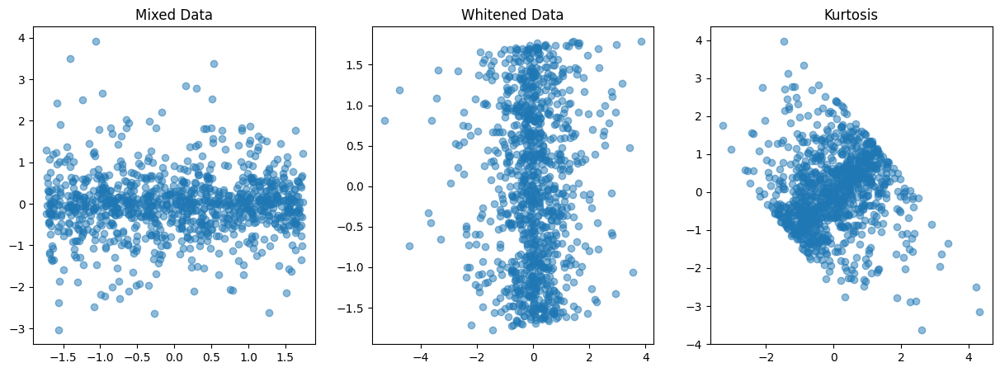

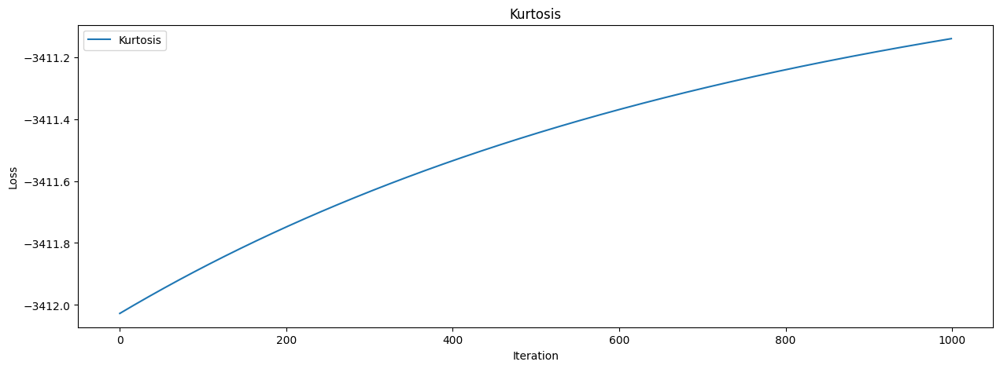

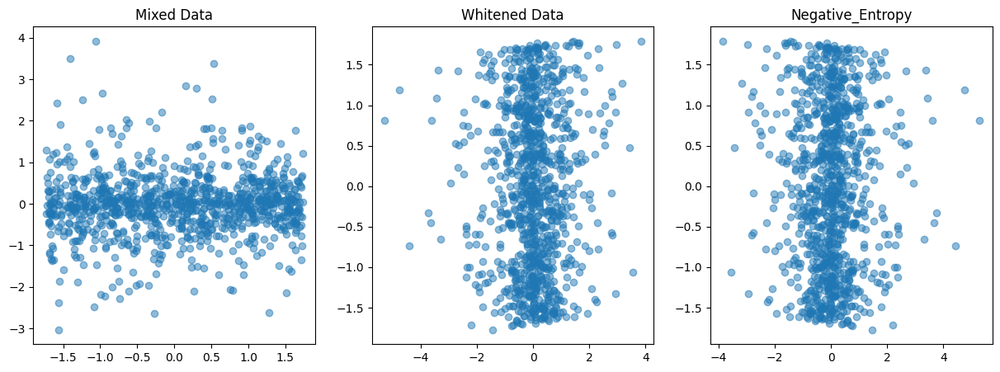

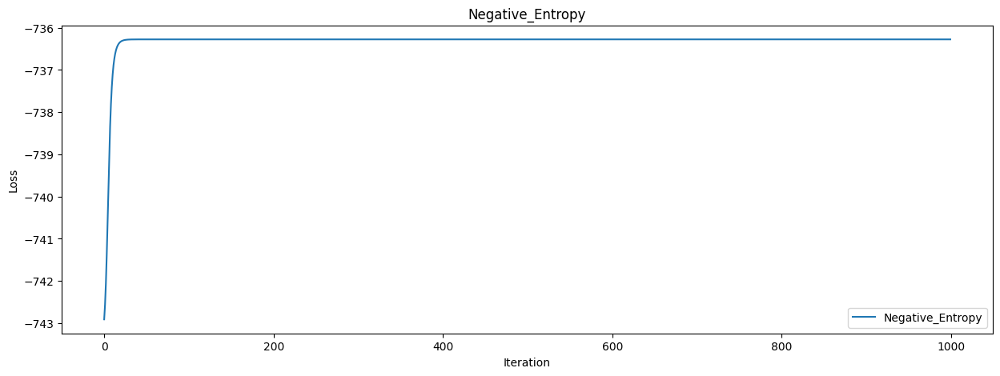

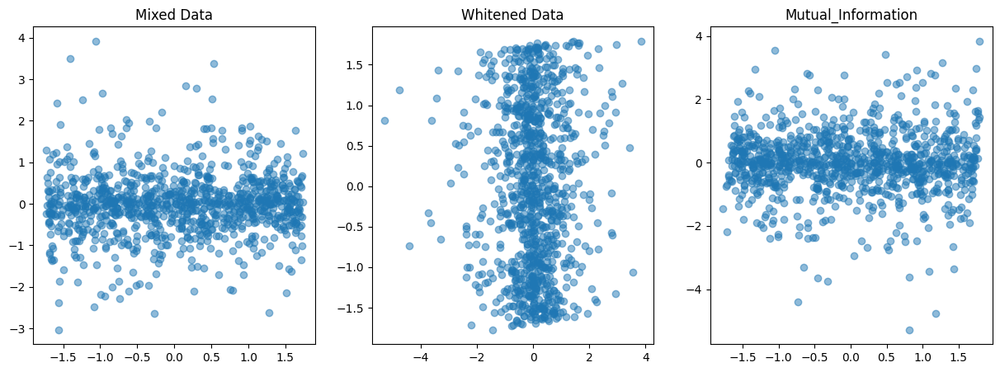

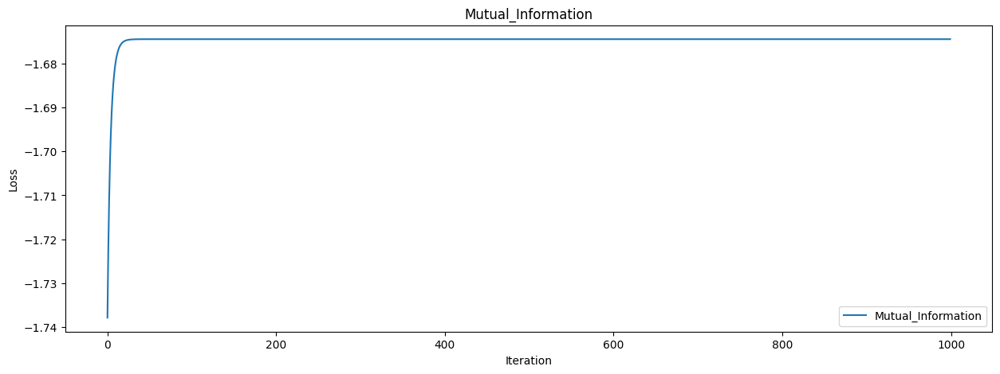

In [105]:
# Apply ICA
loss_functions = ['Kurtosis', 'Negative_Entropy', 'Mutual_Information']

for loss_function in loss_functions:
    losses_dict = {}
    W, losses = ica(X_whitened, loss_function=loss_function)
    S = W @ X_whitened
    losses_dict[loss_function] = losses

    # Plot the results
    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].scatter(X[0, :], X[1, :], alpha=0.5)
    axs[0].set_title('Mixed Data')
    axs[1].scatter(X_whitened[0, :], X_whitened[1, :], alpha=0.5)
    axs[1].set_title('Whitened Data')
    axs[2].scatter(S[0, :], S[1, :], alpha=0.5)
    axs[2].set_title(f'{loss_function}')
    plt.show()

    # Plot the losses
    plt.figure(figsize=(15, 5))
    for loss_function, losses in losses_dict.items():
        plt.plot(losses, label=loss_function)
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title(f'{loss_function}')
    plt.legend()
    plt.show()

### Task 4: ICA, signal separation and reconstruction (2 points)

Consider the EEG dataset ``hw1/data/EEG.npy`` consisting of brain electrical activity of dimension $d=10001$ measured over time via $m=64$ electrodes. In EEG every single electrode captures activity not only in the direct vicitity, but in the neighboring areas as well, so we can of think of every electode signal as a linear mixture of local and neighboring activity, thus suiting the ICA model:

$$\mathbf{X} = \mathbf{A}\mathbf{S}$$

where $\mathbf{S} \in \mathbb{R}^{n \times d}$ - $n$ source signals of dimension $d$, $\mathbf{X} \in \mathbb{R}^{m \times d}$ - $m$ observations of dimension $d$, $\mathbf{A}$ - $m \times n$ mixing matrix, where $m \geq n, \mathrm{Rank}(\mathbf{A}) = n$.

Along with the normal brain activity, the signal may contain various artifacts, like eye blinks, seen as rapid and high amplitude noise corrupting the signal.

The task is to separate the signal from noise, given by ICA components having blinks. Find $n=40$ sources using `FastICA` from sklearn. Handpick the sources contaning blinks and remove them while reconstucting the the signals back from sources, not having the blinks. You can additionally preprocess the data with `PCA` reducing the number of signals to $m_{PCA}=48$.

**Note:** the key for the reconstruction is the mixing matrix $\mathbf{A}$, it can be found via ``ica.mixing_``.

In [ ]:
X = np.load("/content/EEG.npy")

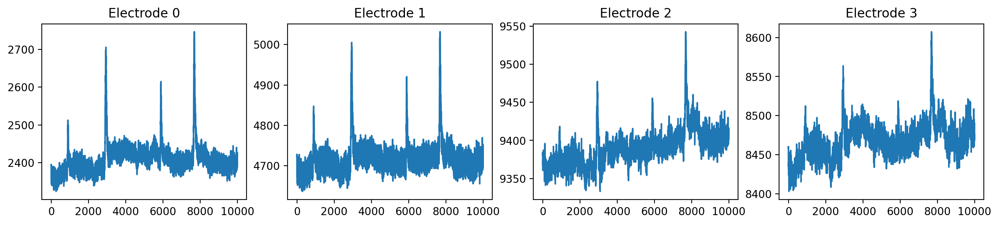

In [ ]:
fig, ax = plt.subplots(1, 4, figsize=(16, 3), dpi=200)
for j in range(4):
    ax[j].set_title("Electrode {}".format(j))
    ax[j].plot(X[:,j])
plt.show()

In [ ]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components=40, random_state=42)
sources = ica.fit_transform(X).T  # Transpose to match sklearn's requirements
A = ica.mixing_

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


Let's look at each of the components and find the artifacts

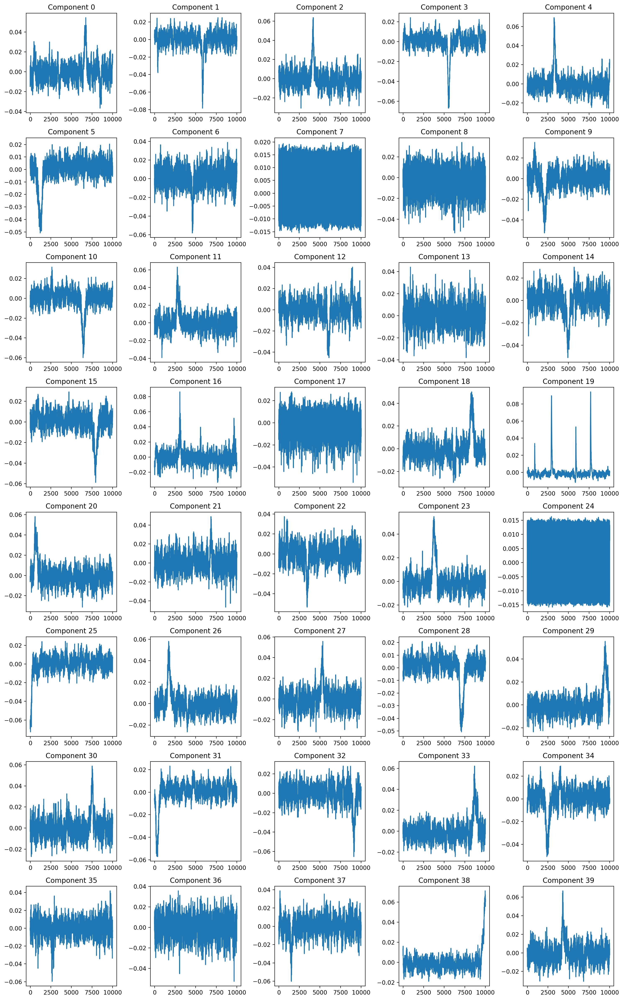

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(15, 24), dpi=200)

for j in range(5 * 8):
    row = j // 5
    col = j % 5
    ax[row, col].set_title(f"Component {j}")
    ax[row, col].plot(sources[j, :])

plt.tight_layout()
plt.show()

Now let's remove the artifact components and restore the signal via `ica.inverse_transform`. It transforms the sources back to the mixed data applying mixing matrix, so we don't need to calculate the mixed matrix ourselves

In [ ]:
non_artifact_components = [0, 7, 8, 12, 13, 17, 21, 24, 36]
artifact_components = [item for item in range(40) if item not in non_artifact_components]

# Zero out the artifact components
clean_sources = np.copy(sources)
clean_sources[artifact_components, :] = 0

# Reconstruct the cleaned signals
cleaned_signals = ica.inverse_transform(clean_sources.T).T

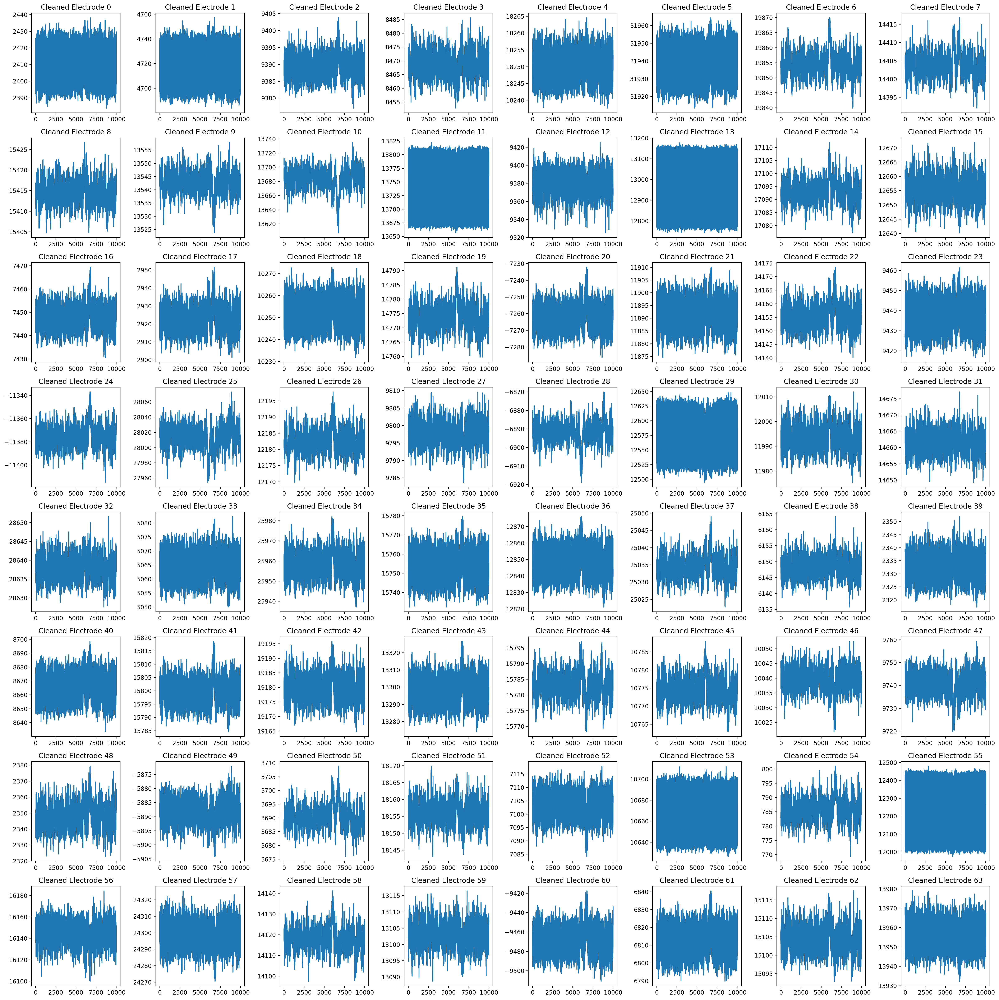

In [ ]:
fig, ax = plt.subplots(8, 8, figsize=(24, 24), dpi=200)

for j in range(8 * 8):
    row = j // 8
    col = j % 8
    ax[row, col].set_title(f"Cleaned Electrode {j}")
    ax[row, col].plot(cleaned_signals[j, :])

plt.tight_layout()
plt.show()

Now the same but applying PCA first

In [ ]:
pca = PCA(n_components=48, random_state=42)
reduced_data = pca.fit_transform(X).T

ica_reduced = FastICA(n_components=40, random_state=42)
sources_reduced = ica_reduced.fit_transform(reduced_data.T).T

/usr/local/lib/python3.10/dist-packages/sklearn/decomposition/_fastica.py:542: FutureWarning: Starting in v1.3, whiten='unit-variance' will be used by default.
  warnings.warn(


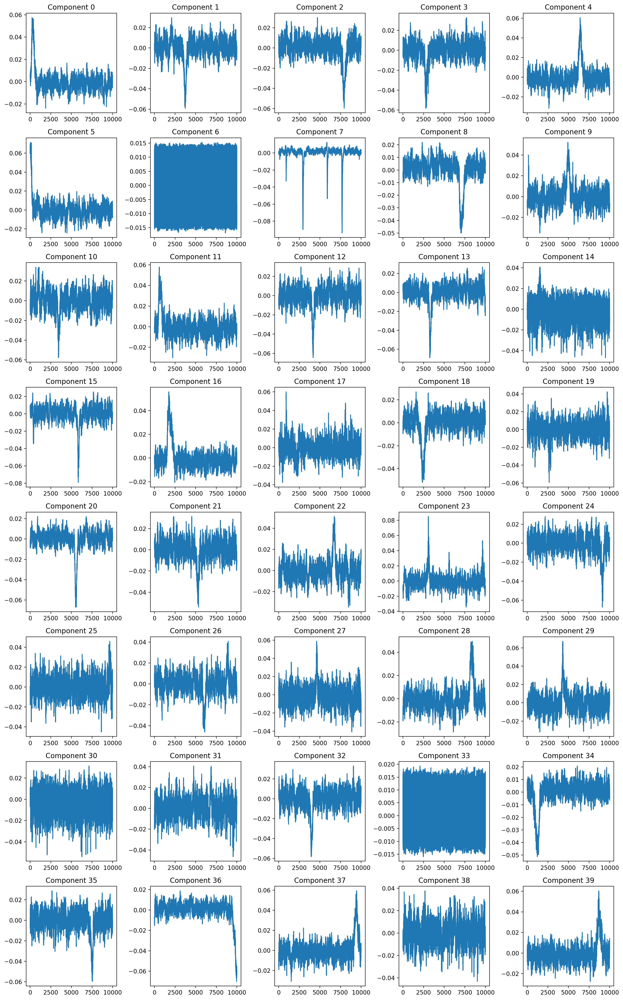

In [ ]:
fig, ax = plt.subplots(8, 5, figsize=(15, 24), dpi=200)

for j in range(5 * 8):
    row = j // 5
    col = j % 5
    ax[row, col].set_title(f"Component {j}")
    ax[row, col].plot(sources_reduced[j, :])

plt.tight_layout()
plt.show()

In [ ]:
non_artifact_components = [6, 14, 33, 30, 38]
artifact_components = [item for item in range(40) if item not in non_artifact_components]

# Zero out the artifact components
clean_sources_reduced = np.copy(sources_reduced)
clean_sources_reduced[artifact_components, :] = 0

# Reconstruct the cleaned signals
cleaned_signals_reduced = ica.inverse_transform(clean_sources_reduced.T).T

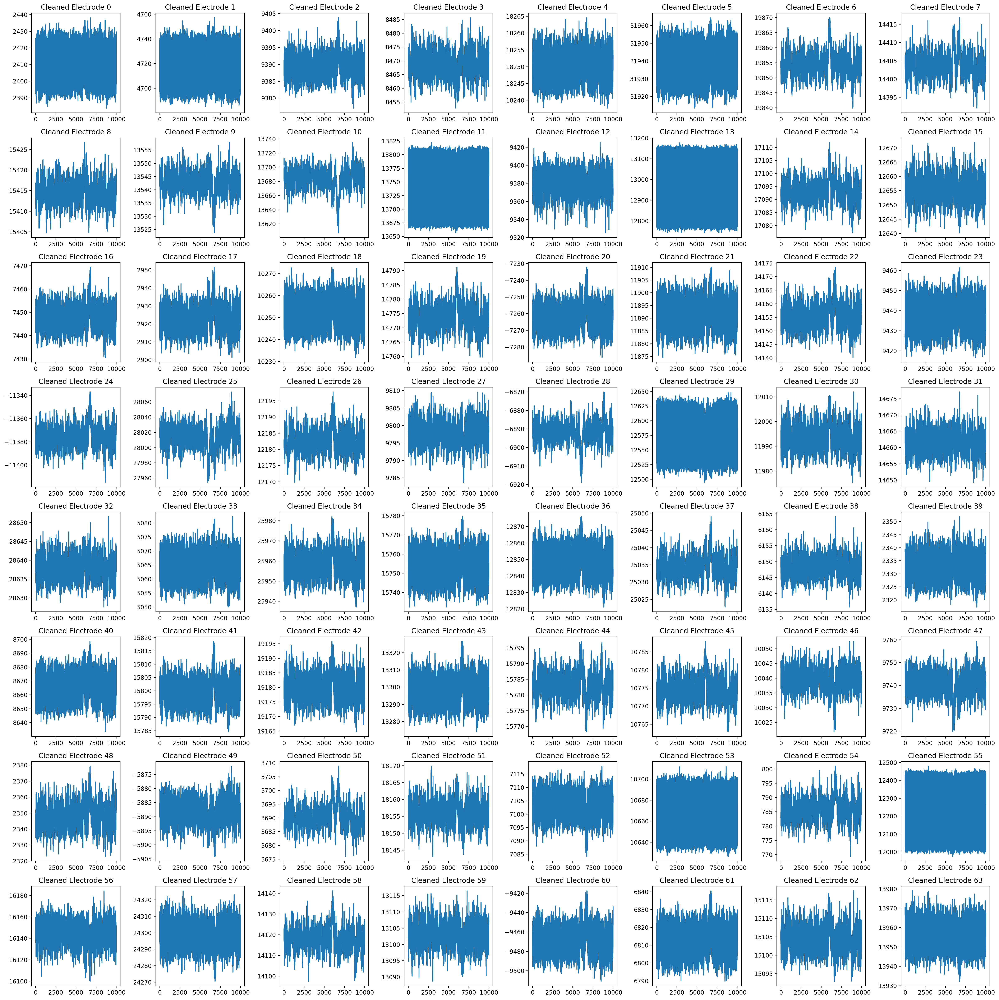

In [ ]:
fig, ax = plt.subplots(8, 8, figsize=(24, 24), dpi=200)

for j in range(8 * 8):
    row = j // 8
    col = j % 8
    ax[row, col].set_title(f"Cleaned Electrode {j}")
    ax[row, col].plot(cleaned_signals[j, :])

plt.tight_layout()
plt.show()

Both implementations results seem pretty similar and clean up the input signal quite well

#### Grading:

- 8/10 points are awarded for completing all the tasks and giving proper answers to questions.
- 2/10 points are awarded for the quality of reporting, be sure to give explanations and comments to your solutions.
- +1 extra point may be awarded for the extra work performed, be creative.